In [ ]:
!pip install -U --pre tensorflow=="2.*"

In [ ]:
!pip install pycocotools

In [ ]:
!pip install tf_slim

In [ ]:
import os
import pathlib

if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models


In [ ]:
import os
import cv2
import numpy as np
from time import time
from tensorflow.keras import utils
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.applications import VGG16
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

In [ ]:
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

In [ ]:
train_dir = 'object_detection/data/mscoco_train'
test_dir = 'object_detection/data/mscoco_test'

In [ ]:
def load_data(train_dir):
  images = []
  labels = []
  size = 32,32
  index = -1
  for folder in os.listdir(train_dir):
    index +=1
    for image in os.listdir(train_dir + "/" + folder):
      temp_img = cv2.imread(train_dir + '/' + folder + '/' + image)
      temp_img = cv2.resize(temp_img, size)
      images.append(temp_img)
      labels.append(index)
    
  images = np.array(images)
  images = images.astype('float32')/255.0
  labels = utils.to_categorical(labels)
  x_train, x_test, y_train, y_test = train_test_split(images, labels, test_size = 0.1)
    
  print('Train data =', x_train.shape)
  print('Test data =', x_test.shape)
    
  return x_train, x_test, y_train, y_test

x_train, x_test, y_train, y_test = load_data(train_dir)

In [ ]:
PATH_TO_LABELS = 'object_detection/data/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

In [ ]:
train_gen = ImageDataGenerator(
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    rescale=1/255,
    validation_split=0.2,
    dtype=tf.float32
)
test_gen = ImageDataGenerator(
    rescale=1/255,
    dtype=tf.float32
)

In [ ]:
Y_train = keras.utils.to_categorical(Y_train)
Y_test = keras.utils.to_categorical(Y_test)
IMG_SIZE = 32
BATCH_SIZE = 64
SEED = 123
train_batch = train_gen.flow(
    X_train, Y_train,
    batch_size = BATCH_SIZE,
    subset = "training",
    seed = SEED
)
valid_batch = train_gen.flow(
    X_train, Y_train,
    batch_size = BATCH_SIZE,
    subset = "validation",
    seed = SEED
)
test_batch = test_gen.flow(
    X_train, Y_train,
    batch_size = BATCH_SIZE,
    shuffle=False
)

In [ ]:
base_model = keras.applications.VGG16(input_shape=(32,32,3), include_top=False, weights='imagenet')
base_model.summary()

In [ ]:
inputs = keras.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
x=base_model(inputs, training=True)
x = layers.Flatten()(x)
x = layers.Dense(1000, activation="relu")(x)
y = layers.Dense(10, activation="softmax")(x)
final_model = keras.Model(inputs=inputs, outputs=y)
final_model.summary()

In [ ]:
final_model.compile(
    optimizer=keras.optimizers.Adam(lr=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
def load_model(model_name):
  
  model_dir = pathlib.Path(model_dir)/"saved_model"

  model = saved_model.load(str(model_dir))
  model = model.signatures['serving_default']

  return model

In [ ]:
model_name = final_model
detection_model = load_model(model_name)

In [ ]:
PATH_TO_TEST_IMAGES_DIR = pathlib.Path('object_detection/data/test_images')
TEST_IMAGE_PATHS = sorted(list(PATH_TO_TEST_IMAGES_DIR.glob("*.jpg")))
TEST_IMAGE_PATHS

In [ ]:
print(detection_model.inputs)
detection_model.output_dtypes

[<tf.Tensor 'image_tensor:0' shape=(None, None, None, 3) dtype=uint8>]


{'detection_boxes': tf.float32,
 'detection_classes': tf.float32,
 'detection_scores': tf.float32,
 'num_detections': tf.float32}

In [ ]:
detection_model.output_shapes

{'detection_boxes': TensorShape([None, 100, 4]),
 'detection_classes': TensorShape([None, 100]),
 'detection_scores': TensorShape([None, 100]),
 'num_detections': TensorShape([None])}

In [ ]:
def run_inference_for_single_image(model, image):
  image = np.asarray(image)
  input_tensor = tf.convert_to_tensor(image)
  input_tensor = input_tensor[tf.newaxis,...]
  output_dict = model(input_tensor)
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, :num_detections].numpy() 
                 for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
  
  if 'detection_masks' in output_dict:
    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(output_dict['detection_masks'], output_dict['detection_boxes'],
               image.shape[0], image.shape[1])      
    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                       tf.uint8)
    output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()
    
  return output_dict

In [ ]:
def show_inference(model, image_path):
  image_np = np.array(Image.open(image_path))
  output_dict = run_inference_for_single_image(model, image_np)
  boxes = []
  classes = []
  scores = []
  for i,x in enumerate(output_dict['detection_classes']):
    if output_dict['detection_scores'][i] > 0.5:
      classes.append(x)
      boxes.append(output_dict['detection_boxes'][i])
      scores.append(output_dict['detection_scores'][i])
  boxes = np.array(boxes)
  classes = np.array(classes)
  scores = np.array(scores)
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      boxes,
      classes,
      scores,
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=4)
  
  display(Image.fromarray(image_np))

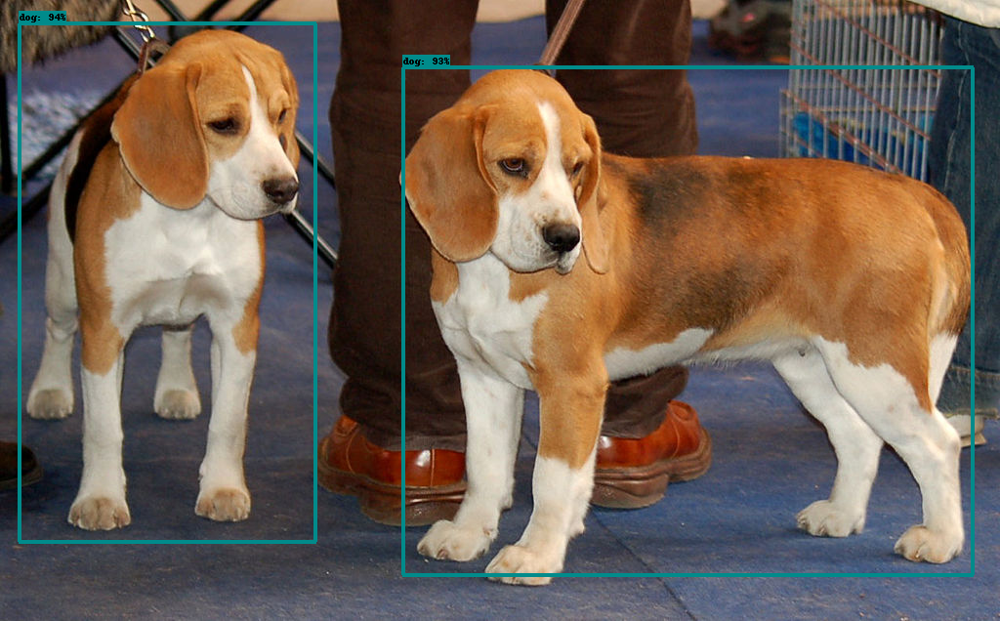

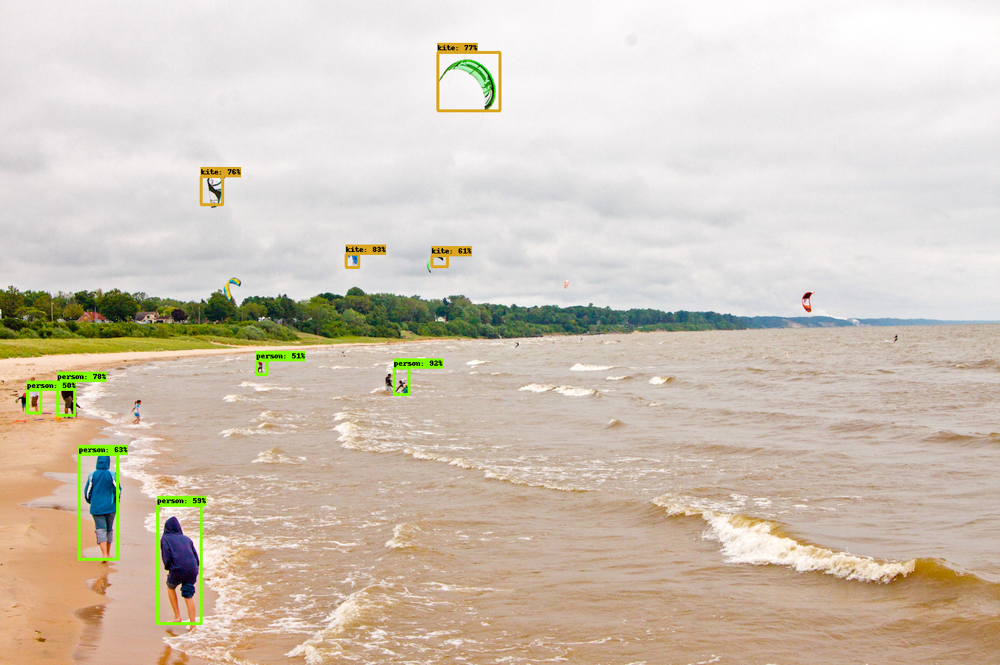

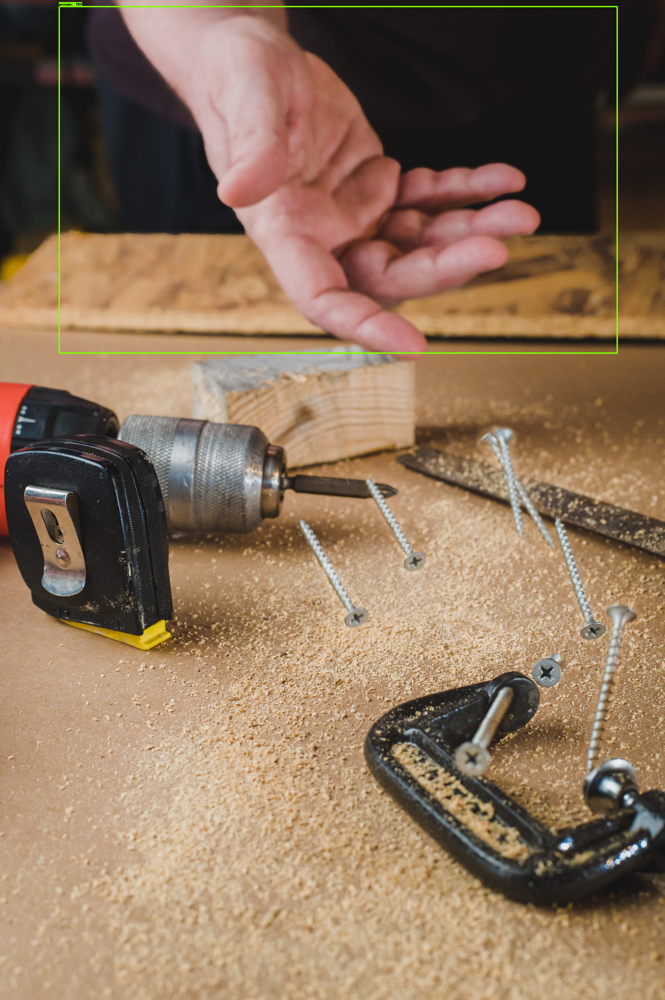

In [ ]:
for image_path in TEST_IMAGE_PATHS:
  show_inference(detection_model, image_path)